In [1]:
import librosa
import pickle

In [2]:
#!pip install mir_eval
#import mir_eval

In [3]:
import IPython.display
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import os
import gc
import random
import os

In [4]:
import tensorflow as tf
import functools
from tensorflow.contrib.framework.python.ops import audio_ops
from tensorflow.python.ops import io_ops
import tensorflow_probability as tfp
#from tensorflow.contrib.signal.python.ops import window_ops

In [5]:
print(tf.__version__)

1.13.1


In [6]:
from keras.layers import *
from keras import Model
import keras.backend as K
from keras.optimizers import Adam
from keras.models import load_model

Using TensorFlow backend.


In [7]:
import matplotlib.style
import matplotlib as mpl
mpl.style.use('classic')

In [8]:
sample_freq = 16000
duration = 3

In [9]:
frame_length = 400
frame_step = 160
fft_length = 512
power_compression = True

mel_bins = 128
low_freq = 0
high_freq = None

In [10]:
!ls "../input/mixspeakersultimate3/mix_speakers_ultimate_3/"

-IbdYAPHKaQ  7ee6-HEjwtg  HerZkp2j5lw  QM1GkWTtR-I  cegwelZAe0E  p18WGG7Cpro
27wI56G9VUk  8E2UlNrLNmk  IS2QoQIBz7Y  RaplNsEg7eg  cnkYLy9x5pU  qErZ2AQDMB4
3TTrIHfGWWg  8nhzwwRYaUI  JlL_v2c-E7Y  SRaJPNKMeOM  deYhN7rYAMw  qXiazLRef-8
3chEXx3X6Yw  9Q21gUd6Dec  KSlic0DVRc0  UH28iJ7lVfg  e5XSP8bktnc  qqr5zw_qPQQ
3fY4X9NlONY  BZxT32NsLRs  Kt0BgFt-h_4  W8tlzT0dvps  eren5jrNTzU  rUiBsv8qwVE
3rTTVuokKT0  BhhZx3A5s0U  LIQkuF_I5Xo  YLoYhIZc_HY  fD2IjiMMX14  uW9YcIxNF5Q
3zac0zo9fGo  CJoOwXcjhds  LTWkdGyz8og  ZeBgVZEoBYc  fIcJsS6LDmo  usawh464DDI
4S7tRoM16AM  D5VEMBpKCFw  MjuHVBiG2V4  ZnIkzq6UbhE  f_Id9iuwYCI  wQlEMg23utc
4iWhovhMvfQ  DIWf1t-HzwI  NDYmMOwovhA  a2iQ7kB5b6s  gFMEmquKDls  xK9fvxGzM1Q
6WAanK3eMRs  E2OnIx97X0s  OVM8-AkG_Gc  bdon571ru0U  h0YpOFOsmpc  xwxbJkXRJHw
6r-b3xou3EQ  GRbxlLGPMlc  OYzQqH1AxZE  c1AKOrVc86I  heqIxWBhjSA  zLSKw9KHI5s
7DBdAnTuw5c  Gqt1A6O6UTk  PQU2MWCKibo  cEy1zKj2Fyc  nQiFsoL96Ao  z_CWD7KOnRw


In [11]:
#check common audio video files

clean_video_path_1 = "../input/cocktail-video-0-400/first_three_second_video_part_1-20190404t075345z-001/first_three_second_video_part_1/"
clean_video_path_2 = "../input/video-400-1000-first-3-seconds/first_three_second_video_part_3-20190606t211109z-001/first_three_second_video_part_3/"

mix_audio_path_1 = "../input/mix-speakers-ultimate-1/mix_speakers_ultimate_1/"
mix_audio_path_2 = "../input/mix-speakers-ultimate-2/mix_speakers_ultimate_2/"
mix_audio_path_3 = "../input/mixspeakersultimate3/mix_speakers_ultimate_3/"
mix_audio_path_4 = "../input/mixspeakersultimate4/mix_speakers_ultimate_4/"
mix_audio_path_5 = "../input/mix-speakers-ultimate-5/mix_speakers_ultimate_5/"
mix_audio_path_6 = "../input/mix-speakers-ultimate-6/mix_speakers_ultimate_6/"
mix_audio_path_7 = "../input/mix-speakers-ultimate-7/mix_speaker_ultimate_7/"
mix_audio_path_8 = "../input/mix-speakers-ultimate-8/mix_speakers_ultimate_8/"
mix_audio_path_9 = "../input/mix-speakers-ultimate-9/mix_speakers_ultimate_9/"
mix_audio_path_10 = "../input/mix-speakers-ultimate-10/mix_speakers_ultimate_10/"
mix_audio_path_11 = "../input/mix-speakers-ultimate-11/mix_speakers_ultimate_11/"

In [12]:
clean_video_files_1 = os.listdir(clean_video_path_1)
clean_video_files_2 = os.listdir(clean_video_path_2)

mix_audio_files_1 = os.listdir(mix_audio_path_1)
mix_audio_files_2 = os.listdir(mix_audio_path_2)
mix_audio_files_3 = os.listdir(mix_audio_path_3)
mix_audio_files_4 = os.listdir(mix_audio_path_4)
mix_audio_files_5 = os.listdir(mix_audio_path_5)
mix_audio_files_6 = os.listdir(mix_audio_path_6)
mix_audio_files_7 = os.listdir(mix_audio_path_7)
mix_audio_files_8 = os.listdir(mix_audio_path_8)
mix_audio_files_9 = os.listdir(mix_audio_path_9)
mix_audio_files_10 = os.listdir(mix_audio_path_10)
mix_audio_files_11 = os.listdir(mix_audio_path_11)

all_mix_files = mix_audio_files_1 + mix_audio_files_2 + mix_audio_files_3 + mix_audio_files_4 + mix_audio_files_5 + mix_audio_files_6 + mix_audio_files_7 + mix_audio_files_8+\
mix_audio_files_9 + mix_audio_files_10 + mix_audio_files_11
all_video_files = clean_video_files_1 + clean_video_files_2
len(all_video_files), len(all_mix_files)

(919, 736)

In [13]:
all_video_files[:5]

['n7z39m8OFTs.pkl',
 '_9r55_-jJ90.pkl',
 'AkPjax1UlaE.pkl',
 '_DKRfbQ0utU.pkl',
 'oUtIW6KbWA4.pkl']

In [14]:
"4JS-4UGZwBg.pkl" in all_video_files

True

In [15]:
#common audio video
common_files = []
common_paths = []

for audio in all_mix_files:
    for video in all_video_files:
        if audio == video.split(".")[0]:  #remove pkl
            common_files.append(audio)
            
print("Common Audio Video files", len(common_files))

audio_d = []
for audio in all_mix_files:
    if audio not in audio_d:
        audio_d.append(audio)
    
    else:
        print("common audio found", audio)
del audio_d        

Common Audio Video files 738


In [16]:
"""
Main dictionary structure

ip -> [mixed audio, video 1, video 2]
op -> [clean_audio 1, clean_audio 2]

video1 -> clean_video/pkl
mixes audio -> audio1/audio2.pkl
clean_audio 1 -> audio1/audio1.pkl

data = {audio1_audio2 : [clean_audio1, clean_audio2, mixed_audio, video1, video2]}
"""

'\nMain dictionary structure\n\nip -> [mixed audio, video 1, video 2]\nop -> [clean_audio 1, clean_audio 2]\n\nvideo1 -> clean_video/pkl\nmixes audio -> audio1/audio2.pkl\nclean_audio 1 -> audio1/audio1.pkl\n\ndata = {audio1_audio2 : [clean_audio1, clean_audio2, mixed_audio, video1, video2]}\n'

In [17]:
os.listdir(mix_audio_path_1 + common_files[0])[:3]

['fDQgWg0Ms_s<-->keLnKbmrW5g.pkl',
 'fDQgWg0Ms_s<-->tkayf4eIXAY.pkl',
 'fDQgWg0Ms_s<-->bZK1_Qft-RE.pkl']

In [18]:
"4JS-4UGZwBg" in common_files

True

In [19]:
"BxGCwss7x2M.pkl" in clean_video_files_1

False

In [20]:
#store path for common files
def create_data(data, common_files, mix_audio_paths, mix_audio_files, clean_video_path_1, clean_video_path_2, clean_video_files):
    
    mix_audio_files_1 = mix_audio_files[0]
    mix_audio_files_2 = mix_audio_files[1]
    mix_audio_files_3 = mix_audio_files[2]
    mix_audio_files_4 = mix_audio_files[3]
    mix_audio_files_5 = mix_audio_files[4]
    mix_audio_files_6 = mix_audio_files[5]
    mix_audio_files_7 = mix_audio_files[6]
    mix_audio_files_8 = mix_audio_files[7]
    mix_audio_files_9 = mix_audio_files[8]
    mix_audio_files_10 = mix_audio_files[9]
    mix_audio_files_11 = mix_audio_files[10]
    
    mix_audio_path_1 = mix_audio_paths[0]
    mix_audio_path_2 = mix_audio_paths[1]
    mix_audio_path_3 = mix_audio_paths[2]
    mix_audio_path_4 = mix_audio_paths[3]
    mix_audio_path_5 = mix_audio_paths[4]
    mix_audio_path_6 = mix_audio_paths[5]
    mix_audio_path_7 = mix_audio_paths[6]
    mix_audio_path_8 = mix_audio_paths[7]
    mix_audio_path_9 = mix_audio_paths[8]
    mix_audio_path_10 = mix_audio_paths[9]
    mix_audio_path_11 = mix_audio_paths[10]
    
    for file in common_files:
        
        if file in mix_audio_files_1:
            mix_audio_path = mix_audio_path_1
        elif file in mix_audio_files_2:
            mix_audio_path = mix_audio_path_2
        elif file in mix_audio_files_3:
            mix_audio_path = mix_audio_path_3
        elif file in mix_audio_files_4:
            mix_audio_path = mix_audio_path_4
        elif file in mix_audio_files_5:
            mix_audio_path = mix_audio_path_5
        elif file in mix_audio_files_6:
            mix_audio_path = mix_audio_path_6
        elif file in mix_audio_files_7:
            mix_audio_path = mix_audio_path_7
        elif file in mix_audio_files_8:
            mix_audio_path = mix_audio_path_8
        elif file in mix_audio_files_9:
            mix_audio_path = mix_audio_path_9
        elif file in mix_audio_files_10:
            mix_audio_path = mix_audio_path_10
        elif file in mix_audio_files_11:
            mix_audio_path = mix_audio_path_11
            
        clean_audio_1 = mix_audio_path + file + "/" + file + ".pkl"
        mixed_subfiles = os.listdir(mix_audio_path + file + "/")

        for subfile in mixed_subfiles:
            if subfile != file + ".pkl":

                file_1, file_2 = subfile.split(".")[0].split("<-->", maxsplit = 1)
                
                if file + ".pkl" in clean_video_files_1:
                    video_1 = clean_video_path_1 + file + ".pkl"
                elif file + ".pkl" in clean_video_files_2:
                    video_1 = clean_video_path_2 + file + ".pkl"
                else:
                    #print(f"----VIDEO 1 NOT FOUND {file}-------")
                    continue
                    
                
                if file_2 + ".pkl" in clean_video_files_1:
                    video_2 = clean_video_path_1 + file_2 + ".pkl"
                if file_2 + ".pkl" in clean_video_files_2:
                    video_2 = clean_video_path_2 + file_2  + ".pkl"
                else:
                    #print(f"----VIDEO 2 NOT FOUND {file_2}--------")
                    continue
                
                #audio file 2 may not be in same mix part
                if file_2 in mix_audio_files_1:
                    mix_audio_path_file_2 = mix_audio_path_1
                elif file_2 in mix_audio_files_2:
                    mix_audio_path_file_2 = mix_audio_path_2
                elif file_2 in mix_audio_files_3:
                    mix_audio_path_file_2 = mix_audio_path_3
                elif file_2 in mix_audio_files_4:
                    mix_audio_path_file_2 = mix_audio_path_4
                elif file_2 in mix_audio_files_5:
                    mix_audio_path_file_2 = mix_audio_path_5
                elif file_2 in mix_audio_files_6:
                    mix_audio_path_file_2 = mix_audio_path_6
                elif file_2 in mix_audio_files_7:
                    mix_audio_path_file_2 = mix_audio_path_7
                elif file_2 in mix_audio_files_8:
                    mix_audio_path_file_2 = mix_audio_path_8
                elif file_2 in mix_audio_files_9:
                    mix_audio_path_file_2 = mix_audio_path_9
                elif file_2 in mix_audio_files_10:
                    mix_audio_path_file_2 = mix_audio_path_10
                elif file_2 in mix_audio_files_11:
                    mix_audio_path_file_2 = mix_audio_path_11
                
                clean_audio_2 = mix_audio_path_file_2 + file_2 + "/" + file_2 + ".pkl"

                mixed_audio = mix_audio_path + file + "/" + subfile

                
 
                data[subfile.split(".")[0]] = [clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2]
                
    return data

In [21]:
"""data = {}
data= create_data(data, common_files, [mix_audio_path_1, mix_audio_path_2, mix_audio_path_3 , mix_audio_path_4 , mix_audio_path_5 , mix_audio_path_6, mix_audio_path_7 ,
                                      mix_audio_path_8, mix_audio_path_9, mix_audio_path_10, mix_audio_path_11],
                  [mix_audio_files_1, mix_audio_files_2, mix_audio_files_3, mix_audio_files_4, mix_audio_files_5, mix_audio_files_6, mix_audio_files_7, mix_audio_files_8,
                  mix_audio_files_9, mix_audio_files_10, mix_audio_files_11], 
                  clean_video_path_1, clean_video_path_2, [clean_video_files_1, clean_video_files_2])

print(len(data))"""

'data = {}\ndata= create_data(data, common_files, [mix_audio_path_1, mix_audio_path_2, mix_audio_path_3 , mix_audio_path_4 , mix_audio_path_5 , mix_audio_path_6, mix_audio_path_7 ,\n                                      mix_audio_path_8, mix_audio_path_9, mix_audio_path_10, mix_audio_path_11],\n                  [mix_audio_files_1, mix_audio_files_2, mix_audio_files_3, mix_audio_files_4, mix_audio_files_5, mix_audio_files_6, mix_audio_files_7, mix_audio_files_8,\n                  mix_audio_files_9, mix_audio_files_10, mix_audio_files_11], \n                  clean_video_path_1, clean_video_path_2, [clean_video_files_1, clean_video_files_2])\n\nprint(len(data))'

In [22]:
def tf_stft(audio, power_compression = power_compression):
      
    with tf.Session(graph=tf.Graph()) as sess:
        holder = tf.placeholder(tf.string, [])
        file = tf.read_file(holder)
        #decoder = audio_ops.decode_wav(file, desired_channels = 1, desired_samples = sample_freq* duration)
        decoder = tf.contrib.ffmpeg.decode_audio(file, file_format = "wav", samples_per_second = sample_freq, channel_count = 1)
        stft = tf.signal.stft(tf.transpose(decoder), frame_length = frame_length, frame_step = frame_step, fft_length = fft_length, 
                              window_fn= tf.signal.hann_window)
        
        amp = tf.squeeze(tf.abs(stft))
        phase = tf.squeeze(tf.angle(stft))
        if power_compression:
          amp = amp ** 0.3
        
        stacked = tf.stack([amp, phase], 2)
        
        op = sess.run([decoder, stft, amp, phase, stacked], feed_dict = {holder: audio})
        #op = sess.run([decoder, stft, amp, phase, stacked, mel_mat, mel_spec, amp_rec], feed_dict = {holder: audio})
                                      
    return op

In [23]:
def tf_istft(stft):
    with tf.Session(graph=tf.Graph()) as sess:
        inv_st = tf.signal.inverse_stft(stft, frame_length = frame_length, frame_step = frame_step, fft_length=fft_length, window_fn=tf.signal.hann_window)
        inv_st_op = sess.run(inv_st)
        return inv_st_op.T

In [24]:
def write_file(data, name, rate = sample_freq):
    encoded_audio_data = tf.contrib.ffmpeg.encode_audio(
        data, file_format="wav", samples_per_second= rate)

    write_file_op = tf.write_file(name, encoded_audio_data)

    with tf.Session() as sess:
        sess.run(write_file_op)
        
def get_complex(stft, power_compression = power_compression):
    if power_compression:
      stft[:,:,0] = stft[:,:,0] ** (1/0.3)
      
    x = np.zeros((stft.shape[0], stft.shape[1]), dtype = "complex64")
    for i in range(0, len(stft[:,0,0])):
        j=0
        for j in range(0, len(stft[0,:,0])):
            x[i, j] = np.complex(stft[i,j,0] * np.cos(stft[i,j,1]) ,stft[i,j,0] * np.sin(stft[i,j,1]))
        
    return x

In [25]:
"""def li_stft(audio, direct_audio ,log = False):
  
  if not direct_audio:
    audio, _ = librosa.load(audio, sr = sample_freq, mono = True, duration = 3)
    
  D = librosa.core.stft(audio, n_fft= frame_length, hop_length= frame_step)
  magnitude, phase = librosa.core.magphase(D)

  mel_filter = librosa.filters.mel(
			sr= sample_freq,
			n_fft= frame_length,
			n_mels=mel_bins,
			fmin= low_freq,
			fmax= high_freq
		)
  
  mel_spectrogram = np.dot(mel_filter, magnitude)

  mel_spectrogram = mel_spectrogram ** 2
  
  if log:
    mel_spectrogram = librosa.power_to_db(mel_spectrogram)
    
  return magnitude, phase, mel_filter, mel_spectrogram

def li_istft(mel_spec, phase, mel_filter, log = False):
  if log:
    mel_spec = librosa.db_to_power(mel_spec)
    
  mel_spec = mel_spec ** 0.5
  
  magnitude = np.dot(np.linalg.pinv(mel_filter), mel_spec)

  if phase is not None:
			inverted_signal = librosa.istft(magnitude * phase, hop_length= frame_step)
  else:
    inverted_signal = griffin_lim(magnitude, frame_length, frame_step, n_iterations=10)
      
      
  #inverted_signal = librosa.istft(magnitude * phase, hop_length= frame_step)
  
  return inverted_signal"""

'def li_stft(audio, direct_audio ,log = False):\n  \n  if not direct_audio:\n    audio, _ = librosa.load(audio, sr = sample_freq, mono = True, duration = 3)\n    \n  D = librosa.core.stft(audio, n_fft= frame_length, hop_length= frame_step)\n  magnitude, phase = librosa.core.magphase(D)\n\n  mel_filter = librosa.filters.mel(\n\t\t\tsr= sample_freq,\n\t\t\tn_fft= frame_length,\n\t\t\tn_mels=mel_bins,\n\t\t\tfmin= low_freq,\n\t\t\tfmax= high_freq\n\t\t)\n  \n  mel_spectrogram = np.dot(mel_filter, magnitude)\n\n  mel_spectrogram = mel_spectrogram ** 2\n  \n  if log:\n    mel_spectrogram = librosa.power_to_db(mel_spectrogram)\n    \n  return magnitude, phase, mel_filter, mel_spectrogram\n\ndef li_istft(mel_spec, phase, mel_filter, log = False):\n  if log:\n    mel_spec = librosa.db_to_power(mel_spec)\n    \n  mel_spec = mel_spec ** 0.5\n  \n  magnitude = np.dot(np.linalg.pinv(mel_filter), mel_spec)\n\n  if phase is not None:\n\t\t\tinverted_signal = librosa.istft(magnitude * phase, hop_leng

In [26]:
def griffin_lim(magnitude, n_fft, hop_length, n_iterations):
	phase_angle = np.pi * np.random.rand(*magnitude.shape)
	D = invert_magnitude_phase(magnitude, phase_angle)
	signal = librosa.istft(D, hop_length=hop_length)

	for i in range(n_iterations):
		D = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)
		_, phase = librosa.magphase(D)
		phase_angle = np.angle(phase)

		D = invert_magnitude_phase(magnitude, phase_angle)
		signal = librosa.istft(D, hop_length=hop_length)

	return signal

def invert_magnitude_phase(magnitude, phase_angle):
	phase = np.cos(phase_angle) + 1.j * np.sin(phase_angle)
	return magnitude * phase

In [27]:
common_files[:5]

['fDQgWg0Ms_s', 'aCHFsX2ze4A', 'yHf-yEHTxns', 't5Ud-0LL2Zg', 'pFPZ5GI7vHQ']

In [28]:
val_speakers = common_files[:5]
#train shouldn't have mix of these files + mix with these files

In [29]:
"""#seperate X and Y
train = []
val = []

for file in data: #s1<-->s2"
    file1, file2 = file.split("<-->", maxsplit = 1)
    if file1 not in val_speakers and file2 not in val_speakers:
        train.append(file)
    else:
        val.append(file)
        
print(len(train), len(val))

train_dic = {}
val_dic = {}

for file in train:
    train_dic[file] = data[file]
for file in val:
    val_dic[file] = data[file]
    
len(train_dic), len(val_dic)

train_keys = list(train_dic.keys())
val_keys = list(val_dic.keys())

train_dic = {}
val_dic = {}

random.shuffle(train_keys)
random.shuffle(val_keys)

for key in train_keys:
    train_dic[key] = data[key]
for key in val_keys:
    val_dic[key] = data[key]
len(train_dic), len(val_dic)"""

'#seperate X and Y\ntrain = []\nval = []\n\nfor file in data: #s1<-->s2"\n    file1, file2 = file.split("<-->", maxsplit = 1)\n    if file1 not in val_speakers and file2 not in val_speakers:\n        train.append(file)\n    else:\n        val.append(file)\n        \nprint(len(train), len(val))\n\ntrain_dic = {}\nval_dic = {}\n\nfor file in train:\n    train_dic[file] = data[file]\nfor file in val:\n    val_dic[file] = data[file]\n    \nlen(train_dic), len(val_dic)\n\ntrain_keys = list(train_dic.keys())\nval_keys = list(val_dic.keys())\n\ntrain_dic = {}\nval_dic = {}\n\nrandom.shuffle(train_keys)\nrandom.shuffle(val_keys)\n\nfor key in train_keys:\n    train_dic[key] = data[key]\nfor key in val_keys:\n    val_dic[key] = data[key]\nlen(train_dic), len(val_dic)'

In [30]:
train_dic = pickle.load(open("../input/audio-seperator-ultimate/train_dic.pkl", "rb"))
val_dic = pickle.load(open("../input/audio-seperator-ultimate/val_dic.pkl", "rb"))

In [31]:
pickle.dump(train_dic, open("train_dic.pkl", "wb"))
pickle.dump(val_dic, open("val_dic.pkl", "wb"))

In [32]:
clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2 = train_dic.get((list(train_dic.keys())[0]))
clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2

('../input/mix-speakers-ultimate-8/mix_speakers_ultimate_8/44KUXV4Ge3A/44KUXV4Ge3A.pkl',
 '../input/mix-speakers-ultimate-6/mix_speakers_ultimate_6/M8BshukFtBk/M8BshukFtBk.pkl',
 '../input/mix-speakers-ultimate-8/mix_speakers_ultimate_8/44KUXV4Ge3A/44KUXV4Ge3A<-->M8BshukFtBk.pkl',
 '../input/cocktail-video-0-400/first_three_second_video_part_1-20190404t075345z-001/first_three_second_video_part_1/44KUXV4Ge3A.pkl',
 '../input/video-400-1000-first-3-seconds/first_three_second_video_part_3-20190606t211109z-001/first_three_second_video_part_3/M8BshukFtBk.pkl')

In [33]:
audio = pickle.load(open(clean_audio_1, "rb"))
video = pickle.load(open(video_1, "rb"))
audio_ip_shape = [audio.shape[0], audio.shape[1]]
video_ip_shape = [video.shape[0], video.shape[1]]
audio_ip_shape, video_ip_shape

([298, 257], [75, 512])

In [34]:
def snr(signal_mag, noise_mag):
  
  signal_power = np.sum(signal_mag ** 2)
  noisy_power = np.sum(noise_mag ** 2)
  snr_power = signal_power/noisy_power #;print(str(snr) + " of 1")  #best 1

  signal_power_db = 10 * np.log10(np.sum(signal_mag ** 2))
  noisy_power_db = 10 * np.log10(np.sum(noise_mag ** 2))
  snr_db = signal_power_db - noisy_power_db #;print(str(snr_db) + " db of 0") #best 0
  return snr_power, snr_db

In [35]:
"""def trainGen(batch_size, train_dic, num_steps):
    #for i in range(3):  # for epochs
    keys = list(train_dic.keys())
    
    while 1:
        for step in range (num_steps):  #1 batch
            x_audio = []
            x_video_1 = []
            x_video_2 = []   
            
            y_audio_1 = []
            y_audio_2 = []   

            batch_keys = keys[step* batch_size : (step+ 1)* batch_size]
            #clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2
            
            for key in batch_keys:
                x_audio.append(pickle.load(open(train_dic[key][2], "rb")))  #ip_audio
        
                x_video_1.append(pickle.load(open(train_dic[key][3], "rb")))  #video
                x_video_2.append(pickle.load(open(train_dic[key][4], "rb")))  #video
            
                y_audio_1.append(pickle.load(open(train_dic[key][0], "rb")))   #audio only
                y_audio_2.append(pickle.load(open(train_dic[key][1], "rb")))   #audio only

            x_audio_arr = np.array(x_audio)
            x_video_arr_1 = np.array(x_video_1)
            x_video_arr_2 = np.array(x_video_2)
            y_audio_arr_1 = np.array(y_audio_1)
            y_audio_arr_2 = np.array(y_audio_2)
            
            yield [x_audio_arr, x_video_arr_1, x_video_arr_2], [y_audio_arr_1, y_audio_arr_2]"""

'def trainGen(batch_size, train_dic, num_steps):\n    #for i in range(3):  # for epochs\n    keys = list(train_dic.keys())\n    \n    while 1:\n        for step in range (num_steps):  #1 batch\n            x_audio = []\n            x_video_1 = []\n            x_video_2 = []   \n            \n            y_audio_1 = []\n            y_audio_2 = []   \n\n            batch_keys = keys[step* batch_size : (step+ 1)* batch_size]\n            #clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2\n            \n            for key in batch_keys:\n                x_audio.append(pickle.load(open(train_dic[key][2], "rb")))  #ip_audio\n        \n                x_video_1.append(pickle.load(open(train_dic[key][3], "rb")))  #video\n                x_video_2.append(pickle.load(open(train_dic[key][4], "rb")))  #video\n            \n                y_audio_1.append(pickle.load(open(train_dic[key][0], "rb")))   #audio only\n                y_audio_2.append(pickle.load(open(train_dic[key][1], "rb")

In [36]:
def valGen(batch_size, val_dic, num_steps):
    #for i in range(3):  # for epochs
    keys = list(val_dic.keys())
    
    while 1:
        for step in range (num_steps):  #1 batch
            x_audio = []
            x_video_1 = []
            x_video_2 = []   
            
            y_audio_1 = []
            y_audio_2 = []   

            batch_keys = keys[step* batch_size : (step+ 1)* batch_size]
            #clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2
            
            for key in batch_keys:
                x_audio.append(pickle.load(open(val_dic[key][2], "rb")))  #ip_audio
        
                x_video_1.append(pickle.load(open(val_dic[key][3], "rb")))  #video
                x_video_2.append(pickle.load(open(val_dic[key][4], "rb")))  #video
            
                y_audio_1.append(pickle.load(open(val_dic[key][0], "rb")))   #audio only
                y_audio_2.append(pickle.load(open(val_dic[key][1], "rb")))   #audio only

            x_audio_arr = np.array(x_audio)
            x_video_arr_1 = np.array(x_video_1)
            x_video_arr_2 = np.array(x_video_2)
            y_audio_arr_1 = np.array(y_audio_1)
            y_audio_arr_2 = np.array(y_audio_2)
            
            yield [x_audio_arr, x_video_arr_1, x_video_arr_2], [y_audio_arr_1, y_audio_arr_2]

In [37]:
def loss(spect1, spect2):
    loss = tf.sqrt(tf.nn.l2_loss(spect1[:,:,:,0] - spect2[:,:,:,0]))
    #loss = tf.sqrt(tf.nn.l2_loss(spect1 - spect2))
    return loss

In [38]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard
es = EarlyStopping(monitor='loss', min_delta=0, patience= 30, verbose=1, mode='min', baseline=None, restore_best_weights= True)
rp = ReduceLROnPlateau(monitor='loss', factor=0.01, patience=5, verbose=1, mode='auto', min_delta=0.0001, cooldown=0, min_lr=0)

In [39]:
def AudioModel(ip, filters = 16, dropout = 0.2):
    
    conv = Conv2D(filters = filters, kernel_size = (3,3), strides = (1,1), padding = "same", dilation_rate = (1,1),
                  activation = "relu")(ip) ; print("conv ", conv.shape)
    conv = BatchNormalization(axis=-1)(conv)
    conv = Dropout(rate = dropout)(conv)
    
    conv = Conv2D(filters = filters, kernel_size = (3,3), strides = (1,1), padding = "same", dilation_rate = (1,1),
                  activation = "relu")(conv) ; print("conv ", conv.shape)
    conv = BatchNormalization(axis=-1)(conv)
    conv = Dropout(rate = dropout)(conv)
    
    conv = Conv2D(filters = filters, kernel_size = (3,3), strides = (1,1), padding = "same", dilation_rate = (1,1),
                  activation = "relu")(conv) ; print("conv ", conv.shape)
    conv = BatchNormalization(axis=-1)(conv)
    conv = Dropout(rate = dropout)(conv)
    
    conv = Conv2D(filters = filters* 2, kernel_size = (3,3), strides = (1,1), padding = "same", dilation_rate = (1,1),
                  activation = "relu")(conv) ; print("conv ", conv.shape)
    conv = BatchNormalization(axis=-1)(conv)
    conv = Dropout(rate = dropout)(conv)
    
    conv = Conv2D(filters = filters* 2, kernel_size = (3,3), strides = (1,1), padding = "same", dilation_rate = (1,1),
                  activation = "relu")(conv) ; print("conv ", conv.shape)
    conv = BatchNormalization(axis=-1)(conv)
    conv = Dropout(rate = dropout)(conv)
    
    conv = Conv2D(filters = filters* 3, kernel_size = (3,3), strides = (1,1), padding = "same", dilation_rate = (1,1),
                  activation = "relu")(conv) ; print("conv ", conv.shape)
    conv = BatchNormalization(axis=-1)(conv)
    conv = Dropout(rate = dropout)(conv)
    
    return conv

In [40]:
def VideoModel(ip, filters = 64):
    #ip has shape -> [bs, 75, 1024]
    """
                conv1   conv2   conv3   conv4   conv5   conv6
    Num Filters 256     256     256     256     256     256
    Filter Size 7 × 1   5 × 1   5 × 1   5 × 1   5 × 1   5 × 1
    Dilation    1 × 1   1 × 1   2 × 1   4 × 1   8 × 1   16 × 1
    Context     7 × 1   9 × 1  13 × 1   21 × 1  37 × 1  69 × 1
    """
    
    conv1 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
                  activation = "relu")(ip)
    con1 = BatchNormalization(axis=-1)(con1)
    
    conv2 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
                  activation = "relu")(conv1)
    conv2 = BatchNormalization(axis=-1)(con2)
    
    conv3 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
                  activation = "relu")(conv2)
    con3 = BatchNormalization(axis=-1)(con3)
    
    conv4 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
                  activation = "relu")(conv3)
    con4 = BatchNormalization(axis=-1)(conv4)
    
    conv5 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
                  activation = "relu")(conv4)
    conv5 = BatchNormalization(axis=-1)(conv5)
    
    conv6 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
                  activation = "relu")(conv5)
    conv6 = BatchNormalization(axis=-1)(conv6)
    
    conv6 = Lambda(lambda x : tf.expand_dims(x, axis = -1))(conv6)  ;print("last video conv ", conv6.shape)
    
    conv7 = Lambda(lambda x: tf.image.resize_nearest_neighbor(x, size = (132, x.shape[-2])))(conv6)
    
    return conv7

In [41]:
filters = 16
conv1 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
              activation = "relu")
bn1 = BatchNormalization(axis=-1)

conv2 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
              activation = "relu")
bn2 = BatchNormalization(axis=-1)

conv3 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
              activation = "relu")
bn3 = BatchNormalization(axis=-1)

conv4 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
              activation = "relu")
bn4 = BatchNormalization(axis=-1)

conv5 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
              activation = "relu")
bn5 = BatchNormalization(axis=-1)

conv6 = Conv1D(filters = filters, kernel_size = (5), padding = "same", dilation_rate = (1),
              activation = "relu")
bn6 = BatchNormalization(axis=-1)

conv7 = Lambda(lambda x : tf.expand_dims(x, axis = -1))

conv8 = Lambda(lambda x: tf.image.resize_nearest_neighbor(x, size = (298, x.shape[-2])))

In [42]:
def FullModel(dropout = 0.2):
    ip = Input(shape = (audio_ip_shape[0], audio_ip_shape[1], 2)) ; print("input_audio", ip.shape) 
    ip_embeddings_1 = Input(shape = (video_ip_shape[0], video_ip_shape[1])); print("ip video", ip_embeddings_1.shape)  #[75, 512]
    ip_embeddings_2 = Input(shape = (video_ip_shape[0], video_ip_shape[1])); print("ip video", ip_embeddings_2.shape)  #[75, 512]
    
    ip_magnitude = Lambda(lambda x : x[:,:,:,0],name="ip_mag")(ip); print("ip_mag ", ip_magnitude.shape)  #takes magnitude from stack[magnitude,phase]
    ip_phase = Lambda(lambda x : tf.expand_dims(x[:,:,:,1], axis = -1),name="ip_phase")(ip); print("ip_phase ", ip_phase.shape)  #takes phase from stack[magnitude,phase]
    
    ip_embeddings_1_expanded = Lambda(lambda x : tf.expand_dims(x, axis = -1))(ip_embeddings_1)
    ip_embeddings_2_expanded = Lambda(lambda x : tf.expand_dims(x, axis = -1))(ip_embeddings_2)
    
    audio_stream = AudioModel(ip)
    #video_stream = VideoModel(ip_embeddings_1)
    #video_stream = VideoModel(ip_embeddings_2)
    
    stream_1 = conv1(ip_embeddings_1)
    stream_1 = bn1(stream_1)
    stream_1 = conv2(stream_1)
    stream_1 = bn2(stream_1)
    stream_1 = conv3(stream_1)
    stream_1 = bn3(stream_1)
    stream_1 = conv4(stream_1)
    stream_1 = bn4(stream_1)
    stream_1 = conv5(stream_1)
    stream_1 = bn5(stream_1)
    stream_1 = conv6(stream_1)
    stream_1 = bn6(stream_1)
    stream_1 = conv7(stream_1) 
    video_stream_1 = conv8(stream_1)
    
    stream_2 = conv1(ip_embeddings_2)
    stream_2 = bn1(stream_2)
    stream_2 = conv2(stream_2)
    stream_2 = bn2(stream_2)
    stream_2 = conv3(stream_2)
    stream_2 = bn3(stream_2)
    stream_2 = conv4(stream_2)
    stream_2 = bn4(stream_2)
    stream_2 = conv5(stream_2)
    stream_2 = bn5(stream_2)
    stream_2 = conv6(stream_2)
    stream_2 = bn6(stream_2)
    stream_2 = conv7(stream_2)
    video_stream_2 = conv8(stream_2)
    
    audio_flatten = TimeDistributed(Flatten())(audio_stream) 
    video_flatten_1 = TimeDistributed(Flatten())(video_stream_1) 
    video_flatten_2 = TimeDistributed(Flatten())(video_stream_2)
    
    print("video Streams ", video_stream_1.shape, video_stream_2.shape)
    print("Flatten Streams", video_flatten_1.shape, video_flatten_2.shape, audio_flatten.shape)
    
    concated = concatenate([audio_flatten, video_flatten_1, video_flatten_2], axis = 2) ;print("concat shape ", concated.shape)
    
    lstm = Bidirectional(LSTM(units = 16, return_sequences = True, activation = "tanh"))(concated)   ;print("lstm", lstm.shape)
    
    #dense = TimeDistributed(Dense(data_shape[1], activation = "sigmoid"))(lstm)
    #output_mag = Lambda(lambda x : tf.multiply(x[0], x[1]), name = "mask_multiply")([ip_magnitude, dense]) ; print("output_mag", output_mag.shape)
    
    flatten = Flatten()(lstm) ;print("flatten ", flatten.shape)
    
    #dense = Dense(data_shape[0] * data_shape[1], activation = "sigmoid")(flatten) ; print("dense1", dense.shape)  #main
    
    dense = Dense(100, activation = "relu")(flatten)
    dense = Dropout(dropout)(dense)
    #dense = Dense(200, activation = "relu")(dense)
    #dense = Dropout(dropout)(dense)
    #dense = Dense(600, activation =  "relu")(dense)
    #dense = Dense(256, activation =  "tanh")(dense)
    dense = Dense(2 * audio_ip_shape[0] * audio_ip_shape[1], activation = "sigmoid")(dense) ;print("dense final ",dense.shape)
    
    combo_mask = Reshape([2 , audio_ip_shape[0], audio_ip_shape[1]])(dense) ; print("combo_mask ", combo_mask.shape)
    mask_1 = Lambda(lambda x : x[:,0])(combo_mask) ;print("mask 1 ", mask_1.shape)
    mask_2 = Lambda(lambda x : x[:,1])(combo_mask) ;print("mask 2 ", mask_2.shape)
    
    output_mag_1 = Lambda(lambda x : tf.multiply(x[0], x[1]), name = "mask_multiply_1")([ip_magnitude, mask_1]) ; print("output_mag_1", output_mag_1.shape)
    output_mag_2 = Lambda(lambda x : tf.multiply(x[0], x[1]), name = "mask_multiply_2")([ip_magnitude, mask_2]) ; print("output_mag_2", output_mag_2.shape)
    
    output_mag_1 = Lambda(lambda x : tf.expand_dims(x, axis= -1), name= "expand_dim_1")(output_mag_1) ; print("output_mag_expand_1", output_mag_1.shape)
    output_mag_2 = Lambda(lambda x : tf.expand_dims(x, axis= -1), name= "expand_dim_2")(output_mag_2) ; print("output_mag_expand_2", output_mag_2.shape)
    
    output_final_1 = Lambda(lambda x : tf.concat(values=[x[0], x[1]], axis = -1),name="concat_mag_phase_1")([output_mag_1, ip_phase]) ; print("output_final_1 ", output_final_1.shape)
    output_final_2 = Lambda(lambda x : tf.concat(values=[x[0], x[1]], axis = -1),name="concat_mag_phase_2")([output_mag_2, ip_phase]) ; print("output_final_2 ", output_final_2.shape)
    
    model = Model([ip, ip_embeddings_1, ip_embeddings_2], [output_final_1, output_final_2])
    #debug_model = Model([ip, ip_embeddings], [reshape, output_mag])
    return model#, debug_model

In [43]:
#model, db_model = FullModel()
#model = FullModel()
model = load_model("../input/audio-seperator-ultimate/model.h5", custom_objects = {"tf" : tf, "loss" : loss})
model.compile(loss = [loss, loss], optimizer = Adam(lr = 0.0001), metrics = ["mse"])

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [44]:
"""small_train = {}
small_keys = list(train_dic.keys())[:10]
for i in small_keys:
    small_train[i] = train_dic[i]

model = FullModel()
model.compile(loss = [loss, loss], optimizer = Adam(lr = 0.00001), metrics = ["mse"])
small_tg = trainGen(10, small_train, 1)
model.fit_generator(small_tg, steps_per_epoch = 5, verbose = 1, epochs = 10000)"""

'small_train = {}\nsmall_keys = list(train_dic.keys())[:10]\nfor i in small_keys:\n    small_train[i] = train_dic[i]\n\nmodel = FullModel()\nmodel.compile(loss = [loss, loss], optimizer = Adam(lr = 0.00001), metrics = ["mse"])\nsmall_tg = trainGen(10, small_train, 1)\nmodel.fit_generator(small_tg, steps_per_epoch = 5, verbose = 1, epochs = 10000)'

In [45]:
#plotmasks([0,1,2,3,4,5], model, small_train)

In [46]:
from keras.utils import Sequence
class trainGen(Sequence):
    def __init__(self, batch_size, train_dic):
        
        self.batch_size = batch_size
        self.train_dic = train_dic
        self.total_len = len(train_dic) / batch_size
        self.keys = list(train_dic.keys())
        
    def __len__(self):
        return int(self.total_len / self.batch_size)
    
    def __getitem__(self, index):
        
        x_audio = []
        x_video_1 = []
        x_video_2 = []   

        y_audio_1 = []
        y_audio_2 = [] 
        
        batch_keys = self.keys[index * self.batch_size : (index+1) * self.batch_size]
        
        for key in batch_keys:
            x_audio.append(pickle.load(open(train_dic[key][2], "rb")))  #ip_audio
        
            x_video_1.append(pickle.load(open(train_dic[key][3], "rb")))  #video
            x_video_2.append(pickle.load(open(train_dic[key][4], "rb")))  #video

            y_audio_1.append(pickle.load(open(train_dic[key][0], "rb")))   #audio only
            y_audio_2.append(pickle.load(open(train_dic[key][1], "rb")))   #audio only

            x_audio_arr = np.array(x_audio)
            x_video_arr_1 = np.array(x_video_1)
            x_video_arr_2 = np.array(x_video_2)
            y_audio_arr_1 = np.array(y_audio_1)
            y_audio_arr_2 = np.array(y_audio_2)
        
        return [x_audio_arr, x_video_arr_1, x_video_arr_2], [y_audio_arr_1, y_audio_arr_2]

In [47]:
batch_size = 32

train_steps = int(np.floor(len(train_dic) / batch_size))
val_steps = int(np.floor(len(val_dic) / batch_size))

tb = TensorBoard(log_dir='./tb_logs', histogram_freq=0, batch_size= batch_size, write_graph=True, write_grads=False, write_images=False,
                 embeddings_freq=0, embeddings_layer_names=None,embeddings_metadata=None, embeddings_data=None, update_freq='epoch')

#tg = trainGen(batch_size, train_dic, train_steps)
tg = trainGen(batch_size, train_dic)
vg = valGen(batch_size, val_dic, val_steps)
#model.fit_generator(generator= tg, epochs = 500, steps_per_epoch = train_steps, verbose = 1, shuffle = True)
model.fit_generator(generator= tg, validation_data = vg, validation_steps = val_steps, epochs = 2,
                    steps_per_epoch = train_steps, verbose = 1, shuffle = True,
                    callbacks = [tb], workers = 5, use_multiprocessing = False)

Epoch 1/2
4334/6273 [===================>..........] - ETA: 55:21 - loss: 303.2635 - concat_mag_phase_1_loss: 150.2318 - concat_mag_phase_2_loss: 153.0317 - concat_mag_phase_1_mean_squared_error: 1.7526 - concat_mag_phase_2_mean_squared_error: 1.7951

In [48]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 298, 257, 2)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 298, 257, 16) 304         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_7 (BatchNor (None, 298, 257, 16) 64          conv2d_1[0][0]                   
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 298, 257, 16) 0           batch_normalization_7[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [49]:
"../input/cocktail-video-0-400/first_three_second_video_part_1-20190404t075345z-001/first_three_second_video_part_1/BlNeh7_qaZo.pkl"

'../input/cocktail-video-0-400/first_three_second_video_part_1-20190404t075345z-001/first_three_second_video_part_1/BlNeh7_qaZo.pkl'

In [50]:
model.save("model.h5")
#db_model.save("db_model.h5")

In [51]:
"""
measure seperation sdr
index = 3

mix_spec = pickle.load(open(train_mix[index] , "rb"))
clean_spec = pickle.load(open(train_clean[index] , "rb"))

pred_model_spec = np.squeeze(model.predict(np.expand_dims(mix_spec, 0)))

snr_pwer, snr_db = snr(pred_model_spec[:,:,0], mix_spec[:,:,0])
print("snr_power {} of 1, snr_db {} of 0".format(snr_pwer, snr_db))

pred_signal = tf_istft(get_complex(pred_model_spec))
source_signal = tf_istft(get_complex(clean_spec))
mix_signal = tf_istft(get_complex(mix_spec))

#src,est
sdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(np.expand_dims(source_signal, 0), np.expand_dims(pred_signal, 0), compute_permutation=False) #need signal directly
print(sdr, sir, sar)
sdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(np.expand_dims(source_signal, 0), np.expand_dims(mix_signal, 0), compute_permutation=False) #need signal directly
print(sdr, sir, sar)
#score = mir_eval.separation.evaluate(np.expand_dims(source_signal, 0), np.expand_dims(mix_signal, 0)) #need signal directly

#print(score)"""

'\nmeasure seperation sdr\nindex = 3\n\nmix_spec = pickle.load(open(train_mix[index] , "rb"))\nclean_spec = pickle.load(open(train_clean[index] , "rb"))\n\npred_model_spec = np.squeeze(model.predict(np.expand_dims(mix_spec, 0)))\n\nsnr_pwer, snr_db = snr(pred_model_spec[:,:,0], mix_spec[:,:,0])\nprint("snr_power {} of 1, snr_db {} of 0".format(snr_pwer, snr_db))\n\npred_signal = tf_istft(get_complex(pred_model_spec))\nsource_signal = tf_istft(get_complex(clean_spec))\nmix_signal = tf_istft(get_complex(mix_spec))\n\n#src,est\nsdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(np.expand_dims(source_signal, 0), np.expand_dims(pred_signal, 0), compute_permutation=False) #need signal directly\nprint(sdr, sir, sar)\nsdr, sir, sar, _ = mir_eval.separation.bss_eval_sources(np.expand_dims(source_signal, 0), np.expand_dims(mix_signal, 0), compute_permutation=False) #need signal directly\nprint(sdr, sir, sar)\n#score = mir_eval.separation.evaluate(np.expand_dims(source_signal, 0), np.expand_

In [52]:
#plt.plot(pred_signal)

In [53]:
#plt.plot(source_signal)

In [54]:
#plt.plot(mix_signal)

In [55]:
model.outputs

[<tf.Tensor 'concat_mag_phase_1/concat:0' shape=(?, 298, 257, 2) dtype=float32>,
 <tf.Tensor 'concat_mag_phase_2/concat:0' shape=(?, 298, 257, 2) dtype=float32>]

In [56]:
model.inputs

[<tf.Tensor 'input_1:0' shape=(?, 298, 257, 2) dtype=float32>,
 <tf.Tensor 'input_2:0' shape=(?, 75, 512) dtype=float32>,
 <tf.Tensor 'input_3:0' shape=(?, 75, 512) dtype=float32>]

In [57]:
def plotmasks(indexes, model, ip_dic):
    #mix_spec , op_spec[1], clean_spec[1]
    #mix_spec, op_spec[2], clean_spec[2]
    keys = list(ip_dic.keys())
    f,ax = plt.subplots(len(indexes) * 2, 3, figsize = (len(indexes) * 10 , len(indexes) * 10))
    i = 0
        
    for key in indexes:
        
        x_audio = np.expand_dims(pickle.load(open(ip_dic[keys[key]][2], "rb")), 0)  #ip_audio
        
        x_video_1 = np.expand_dims(pickle.load(open(ip_dic[keys[key]][3], "rb")),0)  #video
        x_video_2 = np.expand_dims(pickle.load(open(ip_dic[keys[key]][4], "rb")), 0)  #video
            
        y_audio_1 = np.expand_dims(pickle.load(open(ip_dic[keys[key]][0], "rb")), 0)   #audio only
        y_audio_2 = np.expand_dims(pickle.load(open(ip_dic[keys[key]][1], "rb")), 0)   #audio only
    
        pred_1, pred_2 = model.predict([x_audio, x_video_1, x_video_2])
        
        print(x_audio.shape, pred_1.shape)
        ax[i,0].imshow(x_audio[0,:,:,0].T, aspect = "auto", origin = "lower")    #plot magnitude only
        ax[i+1,0].imshow(x_audio[0,:,:,0].T, aspect = "auto", origin = "lower")    #plot magnitude only

        ax[i,1].imshow(pred_1[0,:,:,0].T, aspect = "auto", origin = "lower")
        ax[i+1,1].imshow(pred_2[0,:,:,0].T, aspect = "auto", origin = "lower")
        
        ax[i,2].imshow(y_audio_1[0,:,:,0].T, aspect = "auto", origin = "lower")
        ax[i+1,2].imshow(y_audio_2[0,:,:,0].T, aspect = "auto", origin = "lower")
        i+=2

(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)


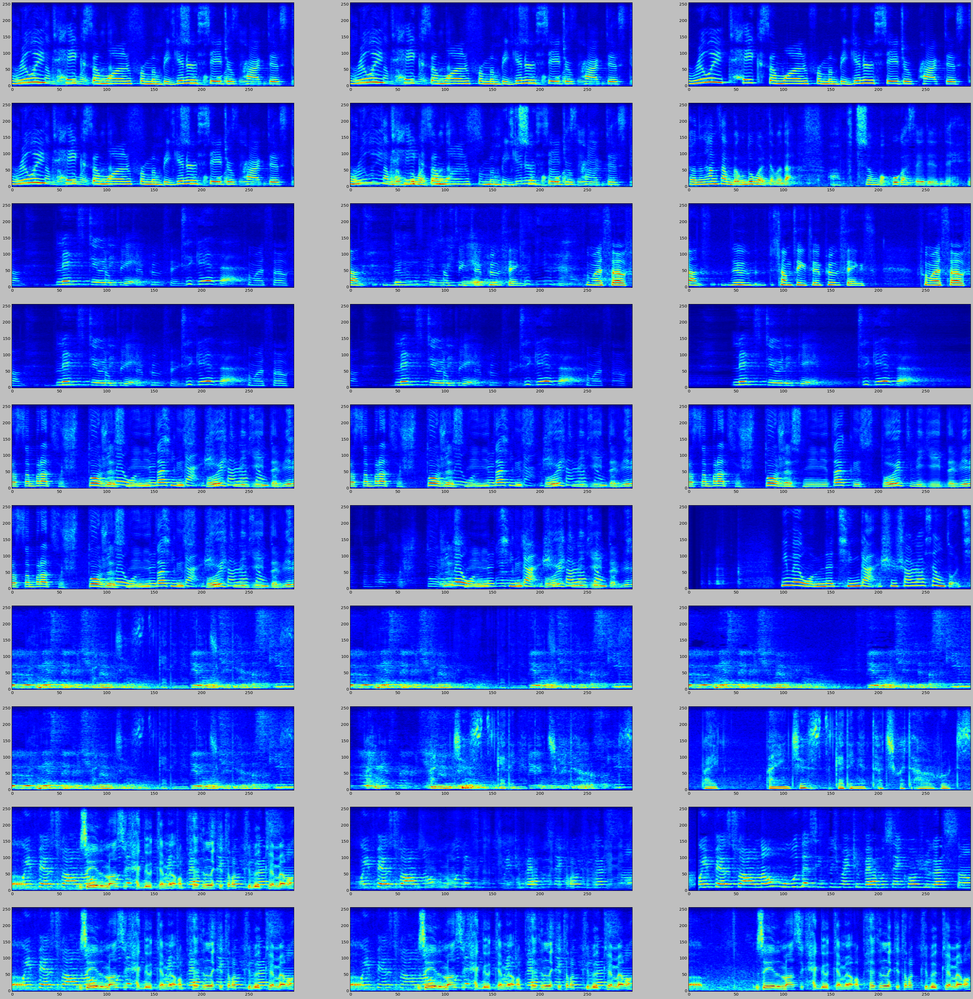

In [58]:
#input file index
plotmasks([34,656,12,56,57], model, train_dic)

(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)
(1, 298, 257, 2) (1, 298, 257, 2)


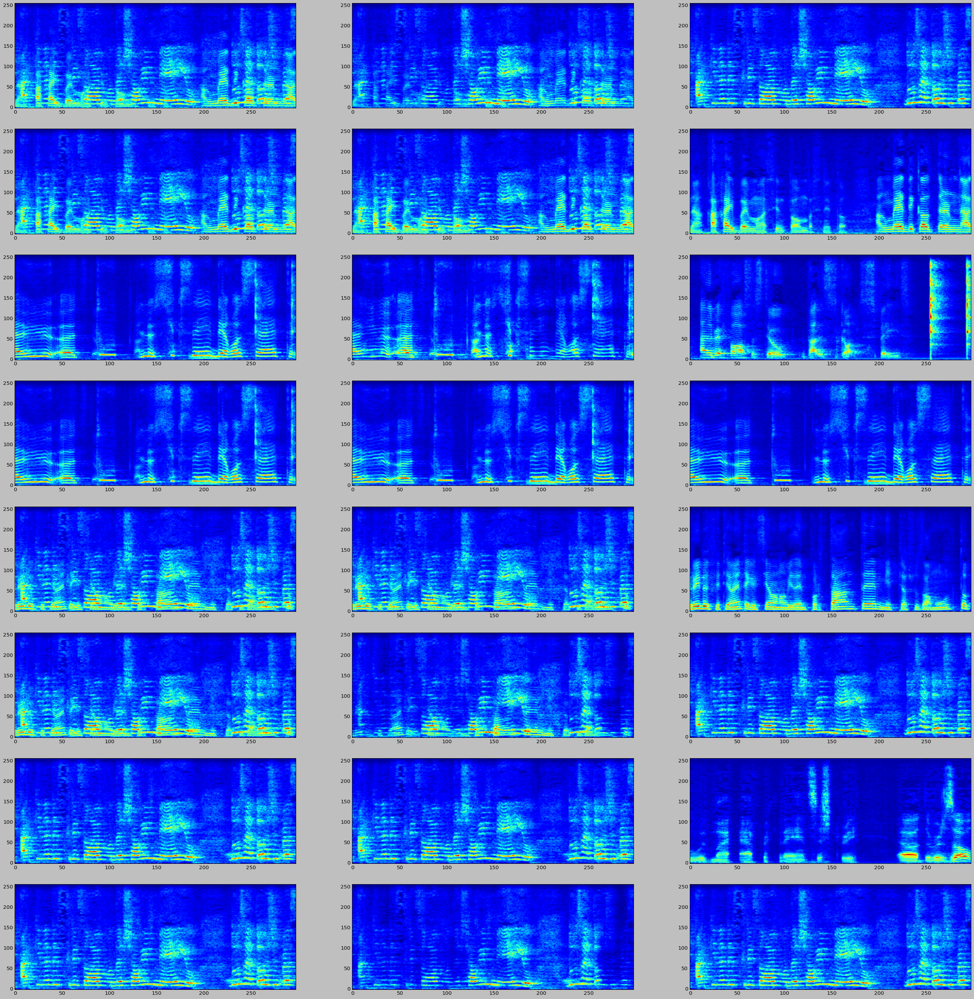

In [59]:
#input file index
plotmasks([67, 78, 90, 890], model, val_dic)

In [60]:
keys[2431]

NameError: name 'keys' is not defined

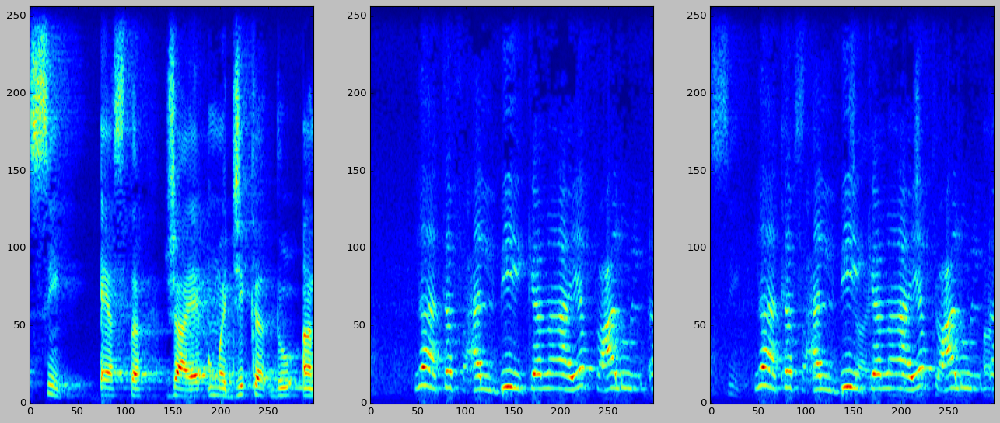

In [61]:
index = 2431
keys = list(train_dic.keys())
clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2  = train_dic[keys[index]]

f, ax = plt.subplots(1,3, figsize = (20,8))
ax[0].imshow(pickle.load(open(clean_audio_1, "rb"))[:,:,0].T, aspect = "auto", origin = "lower")
ax[1].imshow(pickle.load(open(clean_audio_2, "rb"))[:,:,0].T, aspect = "auto", origin = "lower")
ax[2].imshow(pickle.load(open(mixed_audio, "rb"))[:,:,0].T, aspect = "auto", origin = "lower")

In [62]:
def plotmixes(index, count , db_model, clean_files, mix_files):
  #mix_spec, pred_mask, op_spec, clean_spec -> of same file with different mixes
  #not working  
  
  f,ax = plt.subplots(count, 4, figsize = (50, 40 ))
  
  for i in range(count):
    mix_spec = pickle.load(open(data + files[index] + "/" + files[index] + "_mix_{0}.pkl".format(i) , "rb"))
    clean_spec = pickle.load(open(data + files[index] + "/" + files[index] + ".pkl" , "rb"))
    
    ax[i,0].imshow(mix_spec[:,:,0].T, aspect = "auto", origin = "lower")    #plot magnitude only
    
    pred_mask = np.squeeze(db_model.predict(np.expand_dims(mix_spec, 0))[0])   #0 fot db_model give reshape, output_mag
    
    ax[i,1].imshow(pred_mask.T, aspect = "auto", origin = "lower")
    
    pred_spec = np.squeeze(model.predict(np.expand_dims(mix_spec, 0))[:,:,:,0])
    ax[i,2].imshow(pred_spec.T, aspect = "auto", origin = "lower")
    
    ax[i,3].imshow(clean_spec[:,:,0].T, aspect = "auto", origin = "lower")  

In [63]:
#plotmixes(117, 20 , db_model, files, subfiles)

In [64]:
model.inputs, model.outputs

([<tf.Tensor 'input_1:0' shape=(?, 298, 257, 2) dtype=float32>,
  <tf.Tensor 'input_2:0' shape=(?, 75, 512) dtype=float32>,
  <tf.Tensor 'input_3:0' shape=(?, 75, 512) dtype=float32>],
 [<tf.Tensor 'concat_mag_phase_1/concat:0' shape=(?, 298, 257, 2) dtype=float32>,
  <tf.Tensor 'concat_mag_phase_2/concat:0' shape=(?, 298, 257, 2) dtype=float32>])

In [65]:
np.expand_dims()

TypeError: expand_dims() missing 2 required positional arguments: 'a' and 'axis'

### Listen

In [66]:
sample_freq = 16000
window = 400
stride = 160
fft_length =  512

In [67]:
#Listen audios

index = 36
keys = list(val_dic.keys())
clean_audio_1, clean_audio_2, mixed_audio, video_1, video_2  = val_dic[keys[index]]

clean_1 = pickle.load(open(clean_audio_1, "rb"))
clean_2 = pickle.load(open(clean_audio_2, "rb"))
video_1 = np.expand_dims(pickle.load(open(video_1, "rb")), 0)
video_2 = np.expand_dims(pickle.load(open(video_2, "rb")), 0)
mixed = np.expand_dims(pickle.load(open(mixed_audio, "rb")), 0)

pred_1, pred_2 = np.squeeze(model.predict([mixed, video_1, video_2]))

pred_1_complex = get_complex(pred_1)
pred_1_istft = tf_istft(pred_1_complex)
librosa.output.write_wav("pred_1.wav", pred_1_istft, sr = sample_freq)

pred_2_complex = get_complex(pred_2)
pred_2_istft = tf_istft(pred_2_complex)
librosa.output.write_wav("pred_2.wav", pred_2_istft, sr = sample_freq)

mix_complex = get_complex(np.squeeze(mixed))
mix_istft = tf_istft(mix_complex)
librosa.output.write_wav("mixed.wav", mix_istft , sr = sample_freq)

clean_1_complex = get_complex(clean_1)
clean_1_istft = tf_istft(clean_1_complex)
librosa.output.write_wav("clean_1.wav", clean_1_istft , sr = sample_freq)

clean_2_complex = get_complex(clean_2)
clean_2_istft = tf_istft(clean_2_complex)
librosa.output.write_wav("clean_2.wav", clean_2_istft , sr = sample_freq)

In [68]:
IPython.display.Audio("mixed.wav")

In [69]:
IPython.display.Audio("pred_1.wav")

In [70]:
IPython.display.Audio("pred_2.wav")

In [71]:
IPython.display.Audio("clean_1.wav")

In [72]:
IPython.display.Audio("clean_2.wav")

In [73]:
c1.min(), c1.max(), c2.min(), c2.max(), mix.min(), mix.max()

NameError: name 'c1' is not defined

In [74]:
IPython.display.Audio("./mixed.wav")

In [75]:
#model input y
IPython.display.Audio("clean.wav")

ValueError: could not convert string to float: 'clean.wav'

In [76]:
from keras.utils import plot_model
plot_model(model, to_file='model.png')

In [77]:
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 298, 257, 2)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 298, 257, 16) 304         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_7 (BatchNor (None, 298, 257, 16) 64          conv2d_1[0][0]                   
__________________________________________________________________________________________________
dropout_1 (Dropout)             (None, 298, 257, 16) 0           batch_normalization_7[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

In [78]:
mir_eval.separation.bss_eval_sources(source_data, estimated_data, compute_permutation=True)

NameError: name 'mir_eval' is not defined

In [79]:
K.clear_session()
del model
gc.collect()

152388

In [80]:
del db_mdoel

NameError: name 'db_mdoel' is not defined

In [81]:
"""
-> sampled @ 16000
one chatter,one sample
  od = 1.17
  md = 
  
 one chatter,ten sample
  od = 3.60 - 5.00
  md = 9.9902 - 16.00

one chatter,thirty sample
  od = 9.14
  md = 

->sampled @ 5000

one chatter one samples
  od = 2.4800
  md = 2.4440 -> 2-dense-tanh
  md = 2.4417 -> 2-dense-relu

one chatter ten samples
  od = 
  md = 22.0689 -> 2-dense-relu
ranom chatter ten samples
  od=
  md= 25.something -> 2-dense-relu
  md = 10.something -> 2-dense-relu
  md = 34.something -> 2-dense-relu, lstm-64
  md = 9.88 -> 2-dense-relu, lstm-128

one chatter thirty samples
  od = 
  md = 
  
randm chatter 50 samples
  od = 
  md = 15 -> 2-dense-relu, lstm-128
 
 random chatter 100 samples
  od = 
  md = 16 -> 1-dense-relu, lstm-128
  md = 27 -> 3-dense-relu, lstm-128

"""

'\n-> sampled @ 16000\none chatter,one sample\n  od = 1.17\n  md = \n  \n one chatter,ten sample\n  od = 3.60 - 5.00\n  md = 9.9902 - 16.00\n\none chatter,thirty sample\n  od = 9.14\n  md = \n\n->sampled @ 5000\n\none chatter one samples\n  od = 2.4800\n  md = 2.4440 -> 2-dense-tanh\n  md = 2.4417 -> 2-dense-relu\n\none chatter ten samples\n  od = \n  md = 22.0689 -> 2-dense-relu\nranom chatter ten samples\n  od=\n  md= 25.something -> 2-dense-relu\n  md = 10.something -> 2-dense-relu\n  md = 34.something -> 2-dense-relu, lstm-64\n  md = 9.88 -> 2-dense-relu, lstm-128\n\none chatter thirty samples\n  od = \n  md = \n  \nrandm chatter 50 samples\n  od = \n  md = 15 -> 2-dense-relu, lstm-128\n \n random chatter 100 samples\n  od = \n  md = 16 -> 1-dense-relu, lstm-128\n  md = 27 -> 3-dense-relu, lstm-128\n\n'